<a href="https://colab.research.google.com/github/UMassIonTrappers/quantum-computing-labs/blob/main/Lab_05b_Ramsey.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ECE 550/650

## Introduction to Quantum Computing

Robert Niffenegger (rniffenegger@umass.edu )


In [2]:
try:
  import qutip
except ImportError:
  print('Install Qutip')
  !pip install qutip

try:
  import qiskit
except ImportError:
  print('Install Qiskit')
  !pip install -q qiskit
  !pip install -q qiskit[visualization]
  !pip install -q git+https://github.com/qiskit-community/qiskit-textbook.git#subdirectory=qiskit-textbook-src

### Initialize

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from numpy import pi, sqrt, sin, cos
plt.style.use('default') #background can be set to 'dark_backgound'...
linewidth = 4
figsize=5
ani_figsize = 3
fs=15

from pylab import *
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML, display, Math

#QuTiP
import qutip as qt
from qutip import *
from qutip.qip import *
from qutip import qeye, tensor, destroy, fock_dm
from qutip.qip.circuit import Gate
from qutip.qip.operations import *
from qutip.measurement import measure, measurement_statistics

#QISKIT
from qiskit import QuantumCircuit, transpile, assemble
from qiskit.visualization import plot_bloch_multivector, plot_histogram
from qiskit.quantum_info import Statevector
from qiskit_aer import QasmSimulator

#Future add: https://qopt.readthedocs.io/en/latest/examples/rabi_rwa.html

# Lab 5 part B - Ramsey interferometry and decoherence

# Spin Echo - Bloch Sphere

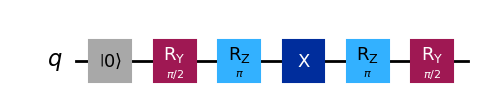

In [4]:
# Create quantum circuit for spin echo
qc = QuantumCircuit(1)

# Initial state |0⟩
qc.reset(0)

# First π/2 pulse around Y axis
qc.ry(np.pi/2, 0)

# Free evolution period
# In real hardware this would be a delay/idle period
# Here we can simulate detuning with a z rotation
qc.rz(np.pi, 0)  

# π pulse around X axis (spin echo pulse)
qc.x(0)

# Second free evolution period
qc.rz(np.pi, 0)

# Final π/2 pulse around Y axis
qc.ry(np.pi/2, 0)

# Measure in computational basis
# qc.measure(0)

# Draw the quantum circuit
qc.draw(output='mpl')




In [5]:

# Function to generate an array of initial spin states
def spin_states_array(spin, proj, num_states):
    return [basis(int(2*spin+1), int(spin+proj)) for _ in range(num_states)]

# Array of initial states (all in -1/2 state)
psi0_array = spin_states_array(1/2, -1/2, 10)

# Hamiltonians
Omega = 1.0  # Define Omega
# Setup pulses
percent_error = 0.0
pulse_error = 1 - percent_error
times = np.linspace(0, pulse_error * (np.pi/2) / Omega, 10)  # π/2 pulse with error
times2 = np.linspace(0, pulse_error * (np.pi) / Omega, 20)  # π pulse with error
# Storage for expectation values
s_list = []

i=0
# Loop over all initial states
for psi0 in psi0_array:
    i = i+1
    delta = 0.02*Omega
    times_i = np.linspace(0, (i) * (np.pi) / Omega,10)  # π pulse with error
    HX = Omega/2 * sigmax() + delta * sigmaz()
    HY = Omega/2 * sigmay() + delta * sigmaz()
    HZ = delta * sigmaz()

    # Apply the first RY/2 pulse (π/2 rotation around Y axis)
    result = sesolve(HY, psi0, times, [])
    s = np.array([expect(sigmax(), result.states),expect(sigmay(), result.states), expect(sigmaz(), result.states)])
    
    # First idle period - free evolution under detuning
    result = sesolve(HZ, result.states[-1], times_i, [])
    s = np.concatenate((s, np.array([expect(sigmax(), result.states),expect(sigmay(), result.states),expect(sigmaz(), result.states)])), axis=1)

    # Apply π pulse around X axis (main correction pulse (spin echo!))
    result = sesolve(HX, result.states[-1], times2, [])
    s = np.concatenate((s, np.array([expect(sigmax(), result.states),expect(sigmay(), result.states),expect(sigmaz(), result.states)])), axis=1)

    # Second idle period - free evolution under detuning
    result = sesolve(HZ, result.states[-1], times_i, [])
    s = np.concatenate((s, np.array([expect(sigmax(), result.states),expect(sigmay(), result.states),expect(sigmaz(), result.states)])), axis=1)

    # Apply the final RY/2 pulse (π/2 rotation around Y axis) to complete the composite pulse sequence
    result = sesolve(HY, result.states[-1], times, [])
    s = np.concatenate((s, np.array([expect(sigmax(), result.states),expect(sigmay(), result.states),expect(sigmaz(), result.states)])), axis=1)
    s_list.append(s)

# Convert lists to arrays (shape: num_states x num_time_steps)
s_array = np.stack(s_list)


In [7]:
# Number of states in simulation
num_states = s_array.shape[0]

# Setup figure for Bloch sphere animation
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d')  # MUST BE SUBPLOT
fig.suptitle(r'Spin Echo - varying detuning errors', fontsize=16)

# Initialize Bloch sphere
sphere = Bloch(axes=ax)
# Generate distinct colors for each state
colors = plt.cm.Reds(np.linspace(0.25, 0.75, num_states))  # Different colors for each state
sphere.vector_color = ['r','pink','pink','pink','b']

def animate(i):
    """Update Bloch sphere animation at step i for multiple states."""
    sphere.clear()
    sphere.vector_color = [colors[i] for i in range(num_states)]
    sphere.point_color = ['r','r','r','r','r','r','r','r','r','r','b']
    for state_idx in range(num_states):
        color = colors[state_idx]
        sphere.add_points([s_array[state_idx, 0, :i+1], s_array[state_idx, 1, :i+1], s_array[state_idx, 2, :i+1]], meth='l')
        sphere.add_vectors([s_array[state_idx, 0, i], s_array[state_idx, 1, i], s_array[state_idx, 2, i]])
        
    # Rotation axis for reference
    if i < len(times):  # During first RY/2 pulse
        sphere.add_vectors([0, 1, 0])  # Y-axis
    elif i < len(times) + len(times_i):  # During first idle time
        sphere.add_vectors([0, 0, 1])  # Z-axis
    elif i < len(times) + len(times_i) + len(times2):  # During X pulse
        sphere.add_vectors([1, 0, 0])  # X-axis
    elif i < len(times) + 2*len(times_i) + len(times2):  # During second idle time
        sphere.add_vectors([0, 0, 1])  # Z-axis
    else:  # During second RY/2 pulse
        sphere.add_vectors([0, 1, 0])  # Y-axis
    sphere.make_sphere()
    return ax

def init():
    return ax

ani = matplotlib.animation.FuncAnimation(fig, animate, np.arange(s_array.shape[2]), init_func=init, blit=False, repeat=True)
plt.close()# don't show the static plot
HTML(ani.to_jshtml())


In [8]:
# To save the animation using Pillow as a gif
writer = matplotlib.animation.PillowWriter(fps=10,metadata=dict(artist='Robert Niffenegger'),bitrate=1800)
ani.save('Spin_Echo.gif', writer=writer)

# Ramsey - Bloch Sphere

In [9]:

# Function to generate an array of initial spin states
def spin_states_array(spin, proj, num_states):
    return [basis(int(2*spin+1), int(spin+proj)) for _ in range(num_states)]

# Array of initial states (all in -1/2 state)
psi0_array = spin_states_array(1/2, -1/2, 10)

# Hamiltonians
Omega = 1.0  # Define Omega
# Setup pulses
percent_error = 0.0
pulse_error = 1 - percent_error
times = np.linspace(0, pulse_error * (np.pi/2) / Omega, 10)  # π/2 pulse with error
times2 = np.linspace(0, pulse_error * (np.pi) / Omega, 20)  # π pulse with error
# Storage for expectation values
s_list = []

i=0
# Loop over all initial states
for psi0 in psi0_array:
    delta = 0.025*Omega
    times_i = np.linspace(0, (i) * (np.pi) / Omega,10)  # π pulse with error
    i = i+1

    HX = Omega/2 * sigmax() + delta * sigmaz()
    HY = Omega/2 * sigmay() + delta * sigmaz()
    HZ = delta * sigmaz()

    # Apply the first RY/2 pulse
    result = sesolve(HY, psi0, times, [])
    s = np.array([expect(sigmax(), result.states),expect(sigmay(), result.states), expect(sigmaz(), result.states)])
    
    result = sesolve(HZ, result.states[-1], times_i, [])
    s = np.concatenate((s, np.array([expect(sigmax(), result.states),expect(sigmay(), result.states),expect(sigmaz(), result.states)])), axis=1)

    # result = sesolve(HX, result.states[-1], times2, [])
    # s = np.concatenate((s, np.array([expect(sigmax(), result.states),expect(sigmay(), result.states),expect(sigmaz(), result.states)])), axis=1)

    result = sesolve(HZ, result.states[-1], times_i, [])
    s = np.concatenate((s, np.array([expect(sigmax(), result.states),expect(sigmay(), result.states),expect(sigmaz(), result.states)])), axis=1)

    # Apply the 2nd RY/2 pulse
    result = sesolve(HY, result.states[-1], times, [])
    s = np.concatenate((s, np.array([expect(sigmax(), result.states),expect(sigmay(), result.states),expect(sigmaz(), result.states)])), axis=1)
    s_list.append(s)

# Convert lists to arrays (shape: num_states x num_time_steps)
s_array = np.stack(s_list)


In [10]:
# Number of states in simulation
num_states = s_array.shape[0]

# Setup figure for Bloch sphere animation
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d')  # MUST BE SUBPLOT
fig.suptitle(r'Ramsey - vary free evolution time', fontsize=16)

# Initialize Bloch sphere
sphere = Bloch(axes=ax)
# Generate distinct colors for each state
colors = plt.cm.Reds(np.linspace(0.25, 0.75, num_states))  # Different colors for each state
sphere.vector_color = ['r','pink','pink','pink','b']

def animate(i):
    """Update Bloch sphere animation at step i for multiple states."""
    sphere.clear()
    sphere.vector_color = [colors[i] for i in range(num_states)]
    sphere.point_color = ['r','r','r','r','r','r','r','r','r','r','b']
    for state_idx in range(num_states):
        color = colors[state_idx]
        sphere.add_points([s_array[state_idx, 0, :i+1], s_array[state_idx, 1, :i+1], s_array[state_idx, 2, :i+1]], meth='l')
        sphere.add_vectors([s_array[state_idx, 0, i], s_array[state_idx, 1, i], s_array[state_idx, 2, i]])
        
    # Rotation axis for reference
    if i < len(times):  # During first RY/2 pulse
        sphere.add_vectors([0, 1, 0])  # Y-axis
    elif i < len(times) + len(times_i):  # During first idle time
        sphere.add_vectors([0, 0, 1])  # Z-axis
    elif i < len(times) + 2*len(times_i):  # During second idle time
        sphere.add_vectors([0, 0, 1])  # Z-axis
    else:  # During second RY/2 pulse
        sphere.add_vectors([0, 1, 0])  # Y-axis

    sphere.make_sphere()
    return ax

def init():
    return ax

ani = matplotlib.animation.FuncAnimation(fig, animate, np.arange(s_array.shape[2]), init_func=init, blit=False, repeat=True)
plt.close()# don't show the static plot
HTML(ani.to_jshtml())


In [12]:
# To save the animation using Pillow as a gif
writer = matplotlib.animation.PillowWriter(fps=10,metadata=dict(artist='Robert Niffenegger'),bitrate=1800)
ani.save('Ramsey.gif', writer=writer)

# Decoherence - Rabi Oscillations

### T2 = decoherence time from spin dephasing (applied via sigmaZ)

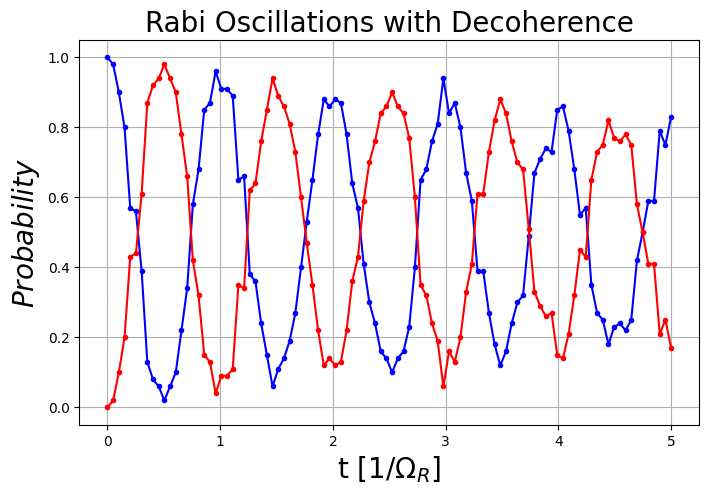

In [387]:
Omega_Rabi = 2*pi*1 # rad/s

HX = Omega_Rabi*sigmax()/2

T2 = 10 #exponential decay time constant of spin dephasing
c_ops = [np.sqrt(1/T2)*sigmaz()]

times=np.linspace(0,5,5*20)

result = mesolve(HX, psi0, times, c_ops, [])

results = {1.0: 0, -1.0: 0}  # 1 and -1 are the possible outcomes
trials = 100
measured_up = []
measured_dn = []
for i in range(len(times)):
  for _ in range(trials):
    value, new_state = measure(result.states[i], sigmaz())
    results[round(value)] += 1
  measured_up.append(results[1.0]/trials)
  measured_dn.append(results[-1.0]/trials)
  results = {1.0: 0, -1.0: 0}


fig, axes = plt.subplots(figsize=(8, 5))
plt.style.use('default')
axes.plot(times, measured_up,'.-b')
axes.plot(times, measured_dn,'.-r')
axes.set_title('Rabi Oscillations with Decoherence', fontsize=20)
axes.set_xlabel(r't $[1/\Omega_R ]$', fontsize=20)
axes.set_ylabel(r'$Probability$', fontsize=20);
# axes.legend(("Up +1/2", "Down -1/2"),loc='upper right');
plt.grid()

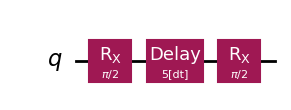

In [406]:
# Create quantum circuit for Ramsey sequence
qc = QuantumCircuit(1)

# First pi/2 pulse
qc.rx(pi/2, 0)

t_free=5
qc.delay(t_free,0)  # Free evolution time

# Second pi/2 pulse 
qc.rx(pi/2, 0)

qc.draw('mpl')

# Decoherence - Ramsey Sequence

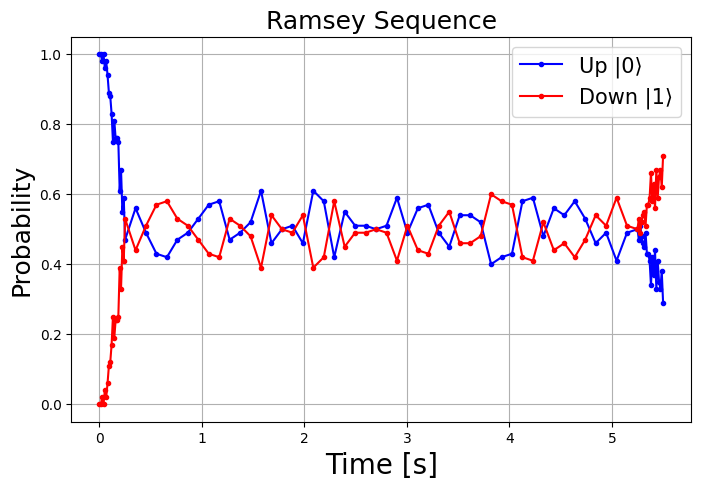

In [423]:
# Free evolution with detuning
HZ = delta*sigmaz()/2

# Time parameters
t_pulse = pi/2*1/Omega_Rabi # Duration of pi/2 pulse
t_free = 5 # Free evolution time
t_total = 2*t_pulse + t_free

# Time arrays for each segment
times1 = np.linspace(0, t_pulse, 20)
times2 = np.linspace(t_pulse, t_pulse+t_free, 50) 
times3 = np.linspace(t_pulse+t_free, t_total, 20)
times_total = np.concatenate((times1, times2[1:], times3[1:]))

# Add spin decoherence (about sigmaZ )
T1 = 10
c_ops = [np.sqrt(1/T2)*sigmaz()]

# Run the sequence
result1 = mesolve(HX, basis(2,0), times1, c_ops, [])
result2 = mesolve(HZ, result1.states[-1], times2[1:], c_ops, [])
result3 = mesolve(HX, result2.states[-1], times3[1:], c_ops, [])

# Combine results
states = []
states.extend(result1.states)
states.extend(result2.states)
states.extend(result3.states)

# Calculate measurement probabilities
results = {1.0: 0, -1.0: 0}
trials = 100
measured_up = []
measured_dn = []

for state in states:
    for _ in range(trials):
        value, new_state = measure(state, sigmaz())
        results[round(value)] += 1
    measured_up.append(results[1.0]/trials)
    measured_dn.append(results[-1.0]/trials)
    results = {1.0: 0, -1.0: 0}

# Plot results
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(times_total, measured_up, '.-b', label='Up |0⟩')
ax.plot(times_total, measured_dn, '.-r', label='Down |1⟩')
ax.set_xlabel('Time [s]',fontsize=20)
ax.set_ylabel('Probability',fontsize=18)
ax.set_title('Ramsey Sequence',fontsize=18)
ax.legend(fontsize=15)
ax.grid(True)
plt.show()


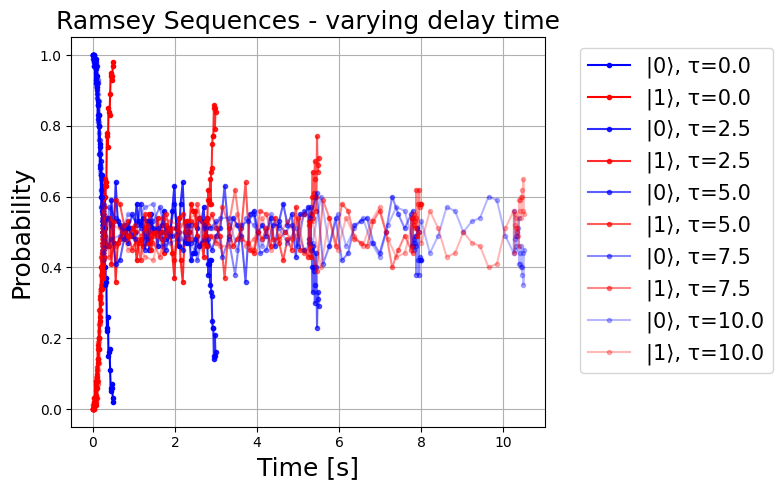

In [424]:
# Run multiple Ramsey sequences with different free evolution times
t_free_list = np.linspace(0, 10, 5)  # Try 5 different free evolution times
all_measured_up = []
all_measured_dn = []
all_times = []

for t_free in t_free_list:
    # Time arrays for each segment 
    times1 = np.linspace(0, t_pulse, 20)
    times2 = np.linspace(t_pulse, t_pulse+t_free, 50)
    times3 = np.linspace(t_pulse+t_free, t_pulse+t_free+t_pulse, 20)
    times_total = np.concatenate((times1, times2[1:], times3[1:]))
    
    # Run the sequence
    result1 = mesolve(HX, basis(2,0), times1, c_ops, [])
    result2 = mesolve(HZ, result1.states[-1], times2[1:], c_ops, [])
    result3 = mesolve(HX, result2.states[-1], times3[1:], c_ops, [])

    # Combine results
    states = []
    states.extend(result1.states)
    states.extend(result2.states)
    states.extend(result3.states)

    # Calculate measurement probabilities
    results = {1.0: 0, -1.0: 0}
    trials = 100
    measured_up = []
    measured_dn = []

    for state in states:
        for _ in range(trials):
            value, new_state = measure(state, sigmaz())
            results[round(value)] += 1
        measured_up.append(results[1.0]/trials)
        measured_dn.append(results[-1.0]/trials)
        results = {1.0: 0, -1.0: 0}
        
    all_measured_up.append(measured_up)
    all_measured_dn.append(measured_dn)
    all_times.append(times_total)

# Plot results
fig, ax = plt.subplots(figsize=(8, 5))
for i, t_free in enumerate(t_free_list):
    alpha = 1 - (i * 0.18)  # Alpha increases from 0.2 to 1.0
    ax.plot(all_times[i], all_measured_up[i], '.-', color='blue', alpha=alpha, 
            label=f'|0⟩, τ={t_free:.1f}')
    ax.plot(all_times[i], all_measured_dn[i], '.-', color='red', alpha=alpha,
            label=f'|1⟩, τ={t_free:.1f}')

ax.set_xlabel('Time [s]',fontsize=18)
ax.set_ylabel('Probability',fontsize=18) 
ax.set_title('Ramsey Sequences - varying delay time',fontsize=18)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left',fontsize=15)
ax.grid(True)
plt.tight_layout()
plt.show()


# Fit decoherence to exponential decay

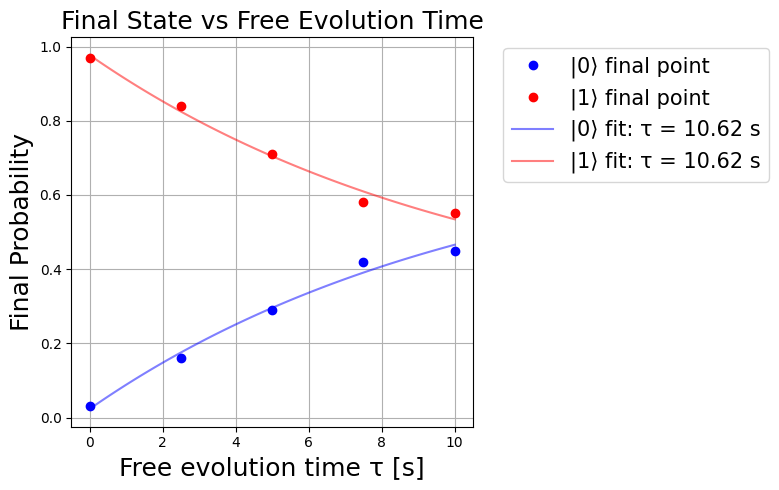

In [426]:
# Plot results
fig, ax = plt.subplots(figsize=(8, 5))

# Extract final points
final_times = [times[-1] for times in all_times]
final_up = [up[-1] for up in all_measured_up]
final_dn = [dn[-1] for dn in all_measured_dn]

# Define exponential decay function
def exp_decay(t, A, tau, C):
    return A * np.exp(-t/tau) + C

# Fit exponential decay to final_up data
popt_up, pcov_up = curve_fit(exp_decay, t_free_list, final_up, p0=[0.5, 1.0, 0.5])
A_up, tau_up, C_up = popt_up

# Fit exponential decay to final_dn data
popt_dn, pcov_dn = curve_fit(exp_decay, t_free_list, final_dn, p0=[0.5, 1.0, 0.5])
A_dn, tau_dn, C_dn = popt_dn

# Generate smooth curve for fitted functions
t_smooth = np.linspace(min(t_free_list), max(t_free_list), 100)
fit_curve_up = exp_decay(t_smooth, A_up, tau_up, C_up)
fit_curve_dn = exp_decay(t_smooth, A_dn, tau_dn, C_dn)

# Plot data and fits
ax.plot(t_free_list, final_up, 'o', color='blue', label='|0⟩ final point')
ax.plot(t_free_list, final_dn, 'o', color='red', label='|1⟩ final point')
ax.plot(t_smooth, fit_curve_up, '-', color='blue', alpha=0.5, 
        label=f'|0⟩ fit: τ = {tau_up:.2f} s')
ax.plot(t_smooth, fit_curve_dn, '-', color='red', alpha=0.5,
        label=f'|1⟩ fit: τ = {tau_dn:.2f} s')

ax.set_xlabel('Free evolution time τ [s]', fontsize=18)
ax.set_ylabel('Final Probability', fontsize=18)
ax.set_title('Final State vs Free Evolution Time', fontsize=18)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=15)
ax.grid(True)
plt.tight_layout()
plt.show()
